Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: nadja-flechner (nadjaflechner). Use `wandb login --relogin` to force relogin


EPOCH:  1
EPOCH:  2
EPOCH:  3
EPOCH:  4
EPOCH:  5
EPOCH:  6
EPOCH:  7
EPOCH:  8
EPOCH:  9
EPOCH:  10
EPOCH:  11
EPOCH:  12
EPOCH:  13
EPOCH:  14
EPOCH:  15


train_accuracy,▁▁▁▁▂▃▄▅▅▆▆▇▇██
train_loss,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁
val_accuracy,▁▁▁▁▁▂▁▃▄▃▂██▆▆
val_loss,█▅▄▃▃▃▂▂▂▂▁▂▂▁▂
train_accuracy,0.69937
train_loss,0.42528
val_accuracy,0.7495
val_loss,0.42199


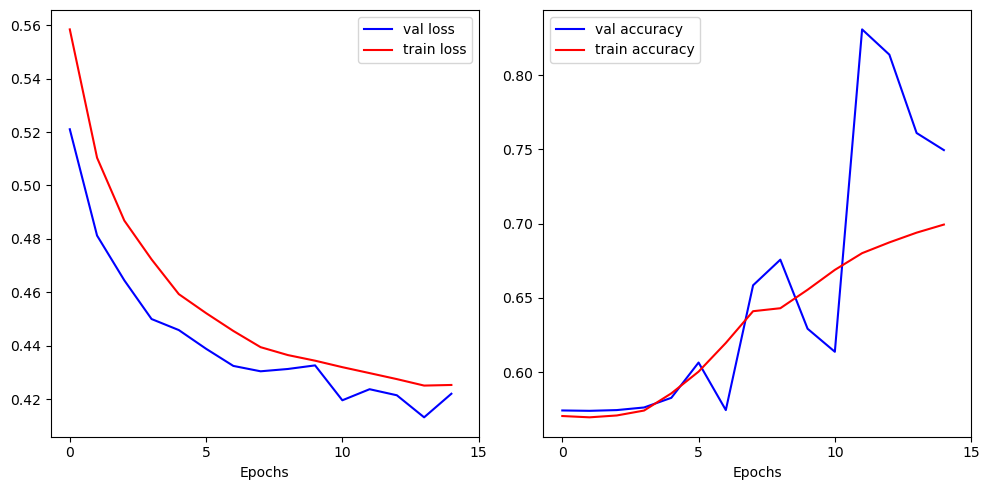

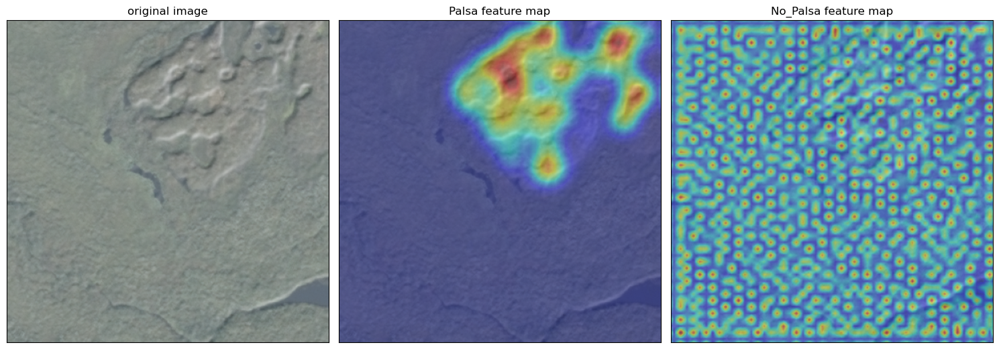

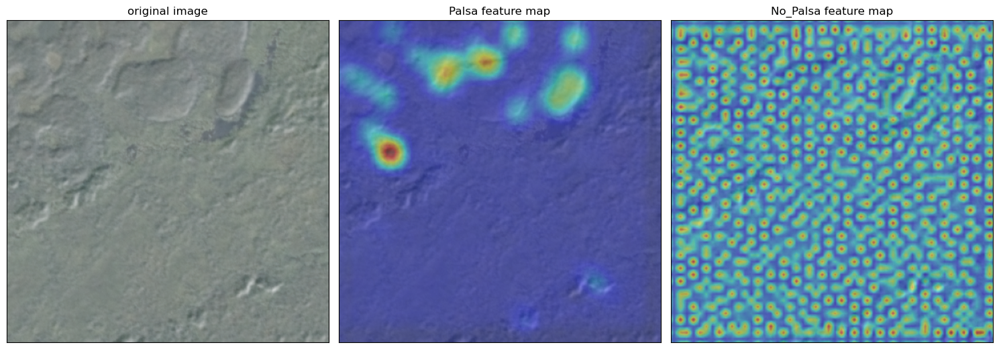

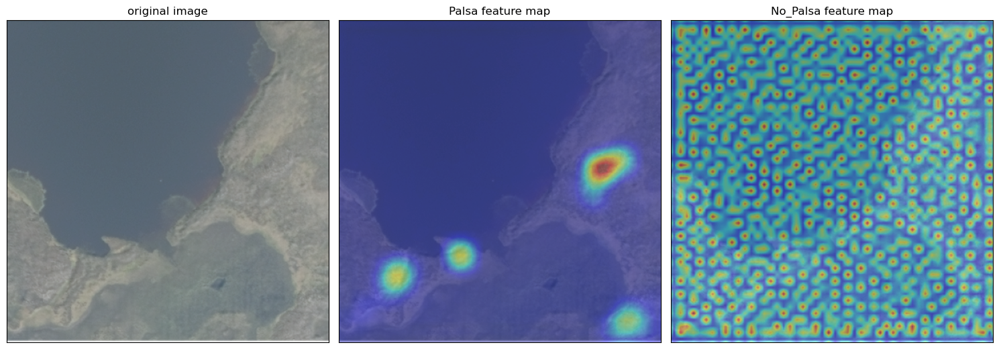

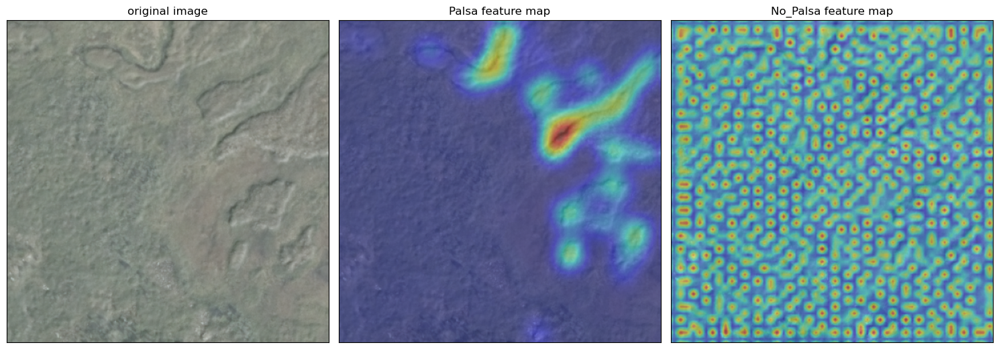

...

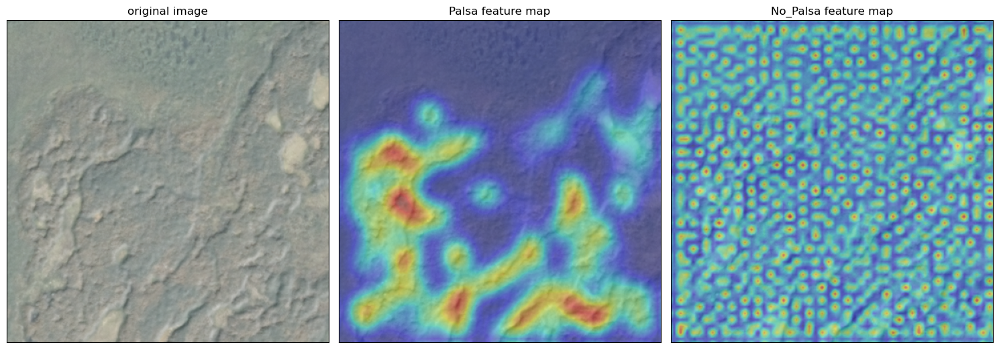

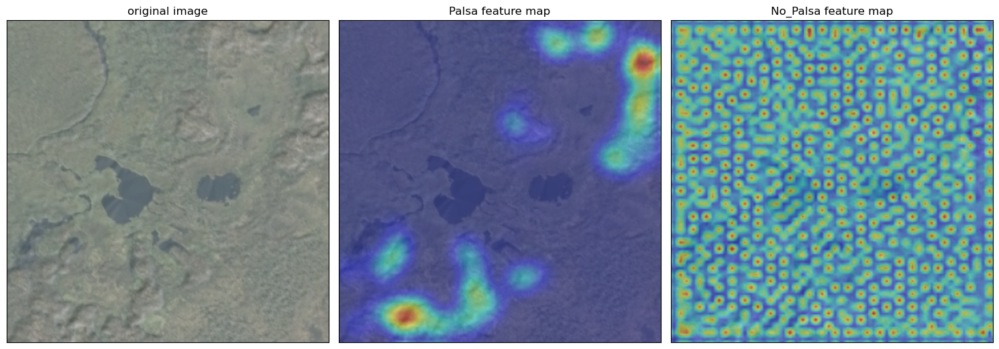

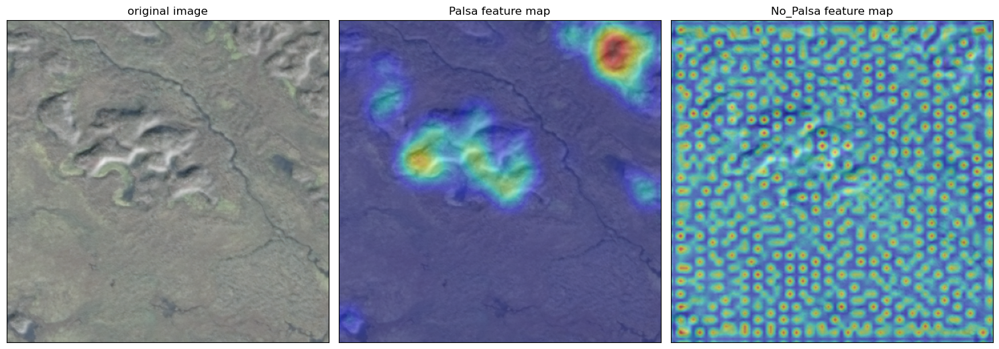

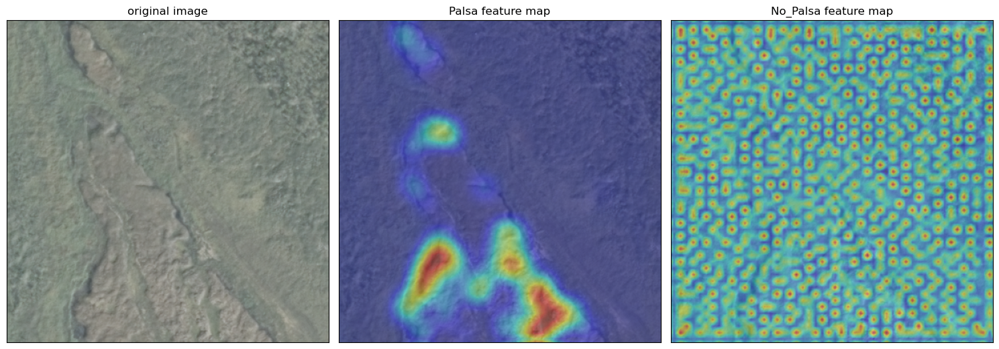

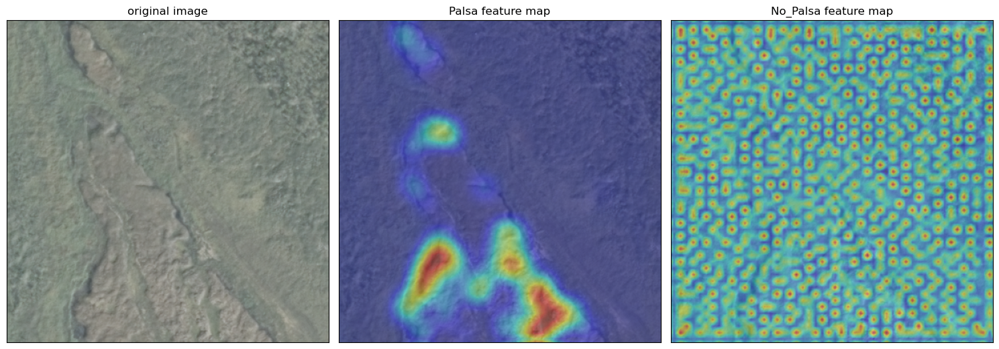

In [1]:
############
# Imports #

import torch
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import rasterio
import numpy as np
from utils import SaveFeatures, imshow_transform
from custom_model import model_4D
from torch.autograd import Variable
from skimage.transform import resize
from skimage.io import imshow
import wandb
import matplotlib.pyplot as plt 
import torch.optim.lr_scheduler as lr_scheduler

%matplotlib inline

import torch
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from torchmetrics import Accuracy

class ImageDataset(Dataset):
    def __init__(self, hs_dir, RGB_dir, labels_df, im_size):
        self.RGB_dir = RGB_dir
        self.hs_dir = hs_dir
        self.labels_df = labels_df
        self.im_size = im_size

    def __len__(self):
        return len(self.labels_df)

    def __getitem__(self, idx):
        img_name = self.labels_df.index[idx]
        RGB_img_path = os.path.join(self.RGB_dir, f"{img_name}.tif")
        hs_img_path = os.path.join(self.hs_dir, f"{img_name}_hs.tif")

        with rasterio.open(RGB_img_path) as RGB_src:
            # Read the image data
            RGB_img = RGB_src.read()

        with rasterio.open(hs_img_path) as hs_src:
            # Read the image data
            hs_img = hs_src.read()

        # convert and upsample hs image
        hs_image_array = np.array(hs_img)
        hs_image_tensor = torch.from_numpy(hs_image_array)
        hs_image_tensor = hs_image_tensor.float()
        bilinear = nn.Upsample(size=self.im_size*2, mode='bilinear')
        hs_upsampled_tensor = bilinear(hs_image_tensor.unsqueeze(0)).squeeze(0) 

        # converting RGB to tensor
        RGB_image_array = np.array(RGB_img)
        RGB_image_tensor = torch.from_numpy(RGB_image_array)
        RGB_image_tensor = RGB_image_tensor.float()

        combined_tensor = torch.concatenate((RGB_image_tensor, hs_upsampled_tensor))

        label = self.labels_df.iloc[idx, 0]
        label = torch.Tensor([1,1]) if label > 0 else torch.Tensor([1,0])

        return combined_tensor, label

#https://www.fast.ai/
#fastai code snippet
class SaveFeatures():
    features=None
    def __init__(self,m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

def accuracy(outputs, labels):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    metric = Accuracy(task='multilabel', num_labels=2).to(device)
    return metric(outputs, labels)

#https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html
def imshow_transform(image_in, title=None):
    """Imshow for Tensor."""
    img = np.rollaxis(image_in.squeeze().cpu().detach().long().numpy(),0,3)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    plt.imshow(img)
    return img


###################
# Hyperparameters #

n_samples = 10000
n_samples_train = int(round(n_samples*0.8))
n_samples_val = int(round(n_samples*0.2))
batch_size = 20
current_computer =  "ubuntu" # "macbook" 
layers_to_freeze = 0
lr = 0.00001
weight_decay=0.06
num_epochs = 15
im_size = 200
min_palsa_positive_samples = 10


##########################
# log hyperparams to w&b #

run = wandb.init(
    # Set the project where this run will be logged
    project="VGG_CAMs",
    # Track hyperparameters and run metadata
    config={
        "learning_rate": lr,
        "epochs": num_epochs,
        "batch_size": batch_size,
        "n_samples": n_samples,
        "layers_to_freeze": layers_to_freeze,
        "weight_decay": weight_decay,
        "im_size": im_size,
        "min_palsa_positive_samples": min_palsa_positive_samples
    },
    tags=['4D', 'LRScheduler', 'MSELoss', 'TrainFromScratch', 'Multilabel']
)

#############
# Load data #

if current_computer == "ubuntu":
    hs_dir = f'/home/nadjaflechner/Palsa_data/cropped_hillshade_{im_size}m/hs'
    RGB_dir = f'/home/nadjaflechner/Palsa_data/cropped_hillshade_{im_size}m/rgb'
    labels_file = f'/home/nadjaflechner/Palsa_data/cropped_hillshade_{im_size}m/palsa_labels.csv'
elif current_computer == "macbook":
    hs_dir = '/Users/nadja/Documents/UU/Thesis/Data/cropped_hillshade/hs'
    RGB_dir = '/Users/nadja/Documents/UU/Thesis/Data/cropped_hillshade/rgb'
    labels_file = '/Users/nadja/Documents/UU/Thesis/Data/cropped_hillshade/palsa_labels.csv'

# Load the labels from the CSV file
if min_palsa_positive_samples > 0:
    labels_df = pd.read_csv(labels_file, index_col=0)
    drop_range = labels_df[ (labels_df['palsa_percentage'] > 0) & (labels_df['palsa_percentage'] < min_palsa_positive_samples) ].index

    labels_df.drop(drop_range, inplace=True)
    labels_df = labels_df.head(n_samples)
else: 
    labels_df = pd.read_csv(labels_file, index_col=0).head(n_samples)


# Split the dataset into training and validation sets
train_df = labels_df.head(n_samples_train)
val_df = labels_df.drop(train_df.index)

# Create the datasets and data loaders
train_dataset = ImageDataset(hs_dir, RGB_dir, train_df, im_size)
val_dataset = ImageDataset(hs_dir, RGB_dir, val_df, im_size)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

model = model_4D()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.92)
loss_function = nn.BCEWithLogitsLoss()

##################
# Training loop #

# adapted from https://github.com/tony-mtz/CAM/blob/master/network/net.py

mean_train_losses = []
mean_val_losses = []

mean_train_acc = []
mean_val_acc = []

max_val_acc = 0

for epoch in range(num_epochs):
    print('EPOCH: ',epoch+1)

    train_acc = []
    val_acc = []

    running_loss = 0.0
    model.train()
    train_batch_count = 0

    for batch_idx, (images, labels) in enumerate(train_loader):     

        # load images and labels 
        images = Variable(images).to(device)  
        labels = Variable(labels).to(device)  

        # train batch   
        outputs = model(images) 
        optimizer.zero_grad()
        loss = loss_function(outputs, labels)
        predicted_labels = (outputs > 0.5).float()
        loss.backward()
        optimizer.step()  

        # calculate loss and accuracy
        train_acc.append(accuracy(outputs, labels).cpu())
        running_loss += loss.item()
        train_batch_count += 1

    del images
    del labels
    del outputs
    torch.cuda.empty_cache()

    model.eval()
    val_batch_count = 0
    val_running_loss = 0.0

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(val_loader):     
            # load images and labels 
            images = Variable(images).to(device)  
            labels = Variable(labels).to(device)  
            outputs = model(images) 
            loss = loss_function(outputs, labels)
            predicted_labels = (outputs > 0.5).float()
            val_acc.append(accuracy(outputs, labels).cpu())
            val_running_loss += loss.item()
            val_batch_count +=1

    scheduler.step()

    del images
    del labels
    del outputs
    torch.cuda.empty_cache()

    # update losses and accuracies 

    mean_train_acc.append(np.mean(train_acc))
    mean_val_acc.append(np.mean(val_acc))
    mean_train_losses.append(running_loss/train_batch_count)
    mean_val_losses.append(val_running_loss/val_batch_count)

    wandb.log({"train_accuracy": np.mean(train_acc)})
    wandb.log({"val_accuracy": np.mean(val_acc)})
    wandb.log({"train_loss": running_loss/train_batch_count})
    wandb.log({"val_loss": val_running_loss/val_batch_count})

    if np.mean(val_acc) > max_val_acc:
        best_model = model.state_dict()
        max_val_acc = np.mean(val_acc)


torch.save(best_model, '/home/nadjaflechner/models/model.pth')
artifact = wandb.Artifact('model', type='model')
artifact.add_file('/home/nadjaflechner/models/model.pth')
run.log_artifact(artifact)

##########################
# plot loss and accuracy #

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))

ax1.plot([i for i in range(num_epochs)], mean_val_losses, c = 'b', label = 'val loss')
ax1.plot([i for i in range(num_epochs)], mean_train_losses, c = 'r', label = 'train loss')
ax1.set_xlabel("Epochs")
ax1.set_xticks(range(0,num_epochs+1,5))
ax1.legend()

ax2.plot([i for i in range(num_epochs)], mean_val_acc, c = 'b', label = 'val accuracy')
ax2.plot([i for i in range(num_epochs)], mean_train_acc, c = 'r', label = 'train accuracy')
ax2.set_xlabel("Epochs")
ax2.set_xticks(range(0,num_epochs+1,5))
ax2.legend()

plt.tight_layout()

wandb.log({'model_performance': wandb.Image(fig)})

####################
# generating CAMs #

#change batch size to 1 to grab one image at a time
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=1, 
                                          shuffle=True,
                                          num_workers=1)

# Load best model to produce CAMs with
model.load_state_dict(best_model)
model.eval()

# Save 10 palsa images
palsa_imgs = 0
for palsa_cam in range(100):
    im, lab = next(iter(valid_loader))

    #get the last convolution
    sf = SaveFeatures(model.features[-4])
    model.eval()

    if lab.sum().detach().cpu().numpy() == 2: # if both classes present in image
        palsa_imgs+= 1
        im = Variable(im).to(device)
        outputs = model(im).to(device)

        # generate CAM
        sf.remove()
        arr = sf.features.cpu().detach().numpy()
        arr1 = arr[0]
        ans_nopalsa = np.dot(np.rollaxis(arr1,0,3), [1,0])
        ans_palsa = np.dot(np.rollaxis(arr1,0,3), [0,1])

        CAM_pals = resize(ans_palsa, (im_size*2,im_size*2))
        CAM_nopals = resize(ans_nopalsa, (im_size*2,im_size*2))

        # Plot image with CAM
        cpu_img = im.squeeze().cpu().detach().permute(1,2,0).long().numpy()

        fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (15,6))

        ax1.imshow(cpu_img)
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_title(f'original image')

        ax2.imshow(cpu_img)
        ax2.imshow(CAM_pals, alpha=.4, cmap='jet')
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.set_title('Palsa feature map')

        ax3.imshow(cpu_img)
        ax3.imshow(CAM_nopals, alpha=.4, cmap='jet')
        ax3.set_xticks([])
        ax3.set_yticks([])
        ax3.set_title('No_Palsa feature map')

        plt.tight_layout()

        wandb.log({'generated_CAM': fig})

    if palsa_imgs == 20:
        break

wandb.finish()
